In [1]:
import sys
import pandas as pd

import matplotlib.pyplot as plt
import numpy as np
import importlib

# project specific
sys.path.append('../src')
import helpers
from utils import benchmark, data_handler, visualisation
from models import VQ_VAE_0, VQ_VAE_1


import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()

import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objs as go

import pickle
import numpy as np
import pandas as pd
from tqdm import tqdm
import torch
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt



from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster


pd.options.display.width = 1000


absolute_path = "c:/thesis/data/cancer"
import scipy.cluster.hierarchy as sch

import pickle



%load_ext tensorboard
!rm -rf ../workfiles/logs/

## Experiment 

### Load dataset
(raw)

In [2]:
dat = pd.read_csv('../external_aproach/BRCA.csv')
dat = dat.drop(dat.columns[[0]], axis=1)
dat = dat.T
feature_num = dat.shape[1]
data_num = dat.shape[0]
data = dat
dat = dat.values.reshape(-1,1,feature_num)
print(dat.shape)

(638, 1, 11327)


In [3]:
index = pd.read_csv('../external_aproach/BRCA-label.csv', header=0)
index = index[0 :data_num].astype(int)
label = index.values.tolist()  
label = [l[0] for l in label]


<Axes: >

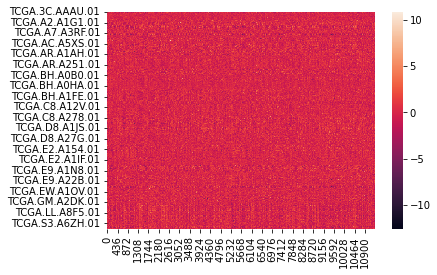

In [4]:
sns.heatmap(data)

In [5]:
class Mydatasets(torch.utils.data.Dataset):
    def __init__(self, data1 ,transform = None):
        self.transform = transform
        self.data1 = data1
        self.datanum = len(data1)

    def __len__(self):
        return self.datanum

    def __getitem__(self, idx):
        
        out_data1 = torch.tensor(self.data1[idx]).float() 
        if self.transform:
            out_data1 = self.transform(out_data1)

        return out_data1

In [6]:
train_data, test_data = train_test_split(dat, test_size = 0.1, random_state = 66)
print('train data:',len(train_data))
print('test data:',len(test_data))
train_data_set = Mydatasets(data1 = train_data)
test_data_set = Mydatasets(data1 = test_data)
train_dataloader = torch.utils.data.DataLoader(train_data_set, batch_size = 32, shuffle=True)
test_dataloader = torch.utils.data.DataLoader(test_data_set, batch_size = 32, shuffle=True)

train data: 574
test data: 64


In [74]:
# for m1 mac
#DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

DEVICE = torch.device("mps")

In [75]:
importlib.reload(VQ_VAE_1)

# best performer
out_dim = 64   
VQ_VAE = VQ_VAE_1.Model(
            dropout = 0.1,
            input_size = feature_num, 
            encoder_dim = out_dim,
            num_embeddings = 512,
            embedding_dim = 32,   
            commitment_cost = 1,
            decay= 0
           ).to(DEVICE)

# using the paper's model
out_dim = 64   
VQ_VAE = VQ_VAE_1.Model(
            dropout = 0.1,
            input_size = feature_num, 
            encoder_dim = out_dim,
            num_embeddings = 512,
            embedding_dim = 32,   
            commitment_cost = 1,
            decay= 0
           ).to(DEVICE)



Classifier_loss = torch.nn.CrossEntropyLoss()
optimizer = optim.Adam(VQ_VAE.parameters(), lr=1e-4, amsgrad=False)
data_variance = np.var(dat)

print(DEVICE)

mps


In [76]:
train_res_recon_error = []
perplexities = []
frames = []
n_frames = 0

In [77]:
EPOCH = 1000

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', min_lr= 0.000001)
print(optimizer.param_groups[0]['lr'])

VQ_VAE.train()


for epoch in tqdm(range(EPOCH)):
    
    running_loss = 0.0
    count = 0
    quantized_merge = torch.empty(0, 1, 64).to(DEVICE)
    
    # Training loop
    for _, inputs in enumerate(train_dataloader):
        optimizer.zero_grad()
        inputs = inputs.to(DEVICE)
        vq_loss, data_recon, perplexity, _, quantized = VQ_VAE(inputs)
        recon_error = F.mse_loss(data_recon, inputs) / data_variance
        loss = recon_error + vq_loss #+ perplexity
        loss.backward()
        optimizer.step()
        count += 1
        running_loss += loss.item()
    
    # Calculate and store training loss for this epoch
    train_loss = running_loss / count
    train_res_recon_error.append(train_loss)
    perplexities.append(perplexity.cpu().detach().numpy())

    # Code to run every 10 epochs
    if (epoch + 1) % 10 == 0:
        # Your additional code here
        en_lat = []
        en_quantized = []
        en_reconstruction = []

        VQ_VAE.eval()

        data_set = Mydatasets(data1 = dat)
        data_set = torch.utils.data.DataLoader(data_set, batch_size = 256, shuffle=False) 


        for i in range(len(dat)):
            en_data = data_set.dataset[i][0]
            latent_1 = VQ_VAE._encoder(en_data.view(1, 1, feature_num).float().to(DEVICE))
            _, data_recon, _, _,latent_2 = VQ_VAE(en_data.view(1, 1, feature_num).float().to(DEVICE))
            en_lat.append(latent_1.cpu().detach().numpy())
            en_quantized.append(latent_2.cpu().detach().numpy())
            en_reconstruction.append(data_recon.cpu().detach().numpy())

        encode_out = np.array(en_lat).reshape(len(dat), -1)
        quantized_out = np.array(en_quantized).reshape(len(dat), -1)
        reconstruction_out = np.array(en_reconstruction).reshape(len(dat), -1)


        stack = np.vstack([dat[0].reshape(1, -1), reconstruction_out[0].reshape(1, -1)])


        pca = PCA(n_components=2)
        pca.fit(quantized_out)
        pca_result = pca.transform(quantized_out)

        

        #index_column = np.full((pca_result.shape[0], 1), epoch + 1, dtype=int)
        index_column = np.full((pca_result.shape[0], 1), n_frames, dtype=int)

        pca_result_with_index = np.hstack((index_column, pca_result))

        frames.append(pca_result_with_index)
        n_frames += 1

        if (epoch + 1) % 500 == 0:

            fig, axs = plt.subplots(1, 4, figsize=(12, 3))


            # Plot the line plot in the second subplot
            axs[0].plot(train_res_recon_error, label='Training Loss')
            axs[0].set_title('Training Loss Plot')
            #axs[0].set_xticks([])

            sns.heatmap(stack, ax=axs[1], cbar=False)
            axs[1].set_title('Stacked heatmap of two samples')
            axs[1].set_xticks([])
            axs[1].set_yticks([])


            sns.heatmap(quantized_out, ax = axs[2], cbar=False)
            axs[2].set_title('Heatmap of hole quantized dataset')
            axs[2].set_xticks([])
            axs[2].set_yticks([])


            sns.scatterplot(x = pca_result[:, 0], y = pca_result[:, 1], c=label, ax=axs[3])
            axs[3].set_title('PCA')
            axs[3].set_xticks([])
            axs[3].set_yticks([])

            plt.subplots_adjust(wspace=0)  
            plt.tight_layout()
            plt.show()




    
# Plot training and validation loss curves
epochs = np.arange(1, EPOCH + 1)
plt.plot(epochs, train_res_recon_error, label='Training Loss')
#plt.plot(epochs, val_res_recon_error, label='Validation Loss')
plt.plot(epochs, perplexities, label='Perplexity')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

print(optimizer.param_groups[0]['lr'])


0.0001


  1%|          | 9/1000 [00:23<40:55,  2.48s/it]  

Additional code executed at epoch 10


  2%|▏         | 19/1000 [00:51<32:51,  2.01s/it]  

Additional code executed at epoch 20


  3%|▎         | 29/1000 [01:16<31:32,  1.95s/it]  

Additional code executed at epoch 30


  4%|▍         | 39/1000 [01:41<30:47,  1.92s/it]  

Additional code executed at epoch 40


  5%|▍         | 49/1000 [02:06<30:47,  1.94s/it]

Additional code executed at epoch 50


  6%|▌         | 59/1000 [02:31<29:54,  1.91s/it]

Additional code executed at epoch 60


  7%|▋         | 69/1000 [02:55<29:41,  1.91s/it]

Additional code executed at epoch 70


  8%|▊         | 79/1000 [03:19<29:06,  1.90s/it]

Additional code executed at epoch 80


  9%|▉         | 89/1000 [03:44<28:42,  1.89s/it]

Additional code executed at epoch 90


 10%|▉         | 99/1000 [04:09<29:11,  1.94s/it]

Additional code executed at epoch 100


 11%|█         | 109/1000 [04:33<28:17,  1.90s/it]

Additional code executed at epoch 110


 12%|█▏        | 119/1000 [04:58<28:16,  1.93s/it]

Additional code executed at epoch 120


 13%|█▎        | 129/1000 [05:24<29:02,  2.00s/it]

Additional code executed at epoch 130


 14%|█▍        | 139/1000 [05:49<28:04,  1.96s/it]

Additional code executed at epoch 140


 15%|█▍        | 149/1000 [06:15<27:44,  1.96s/it]

Additional code executed at epoch 150


 16%|█▌        | 159/1000 [06:39<26:45,  1.91s/it]

Additional code executed at epoch 160


 17%|█▋        | 169/1000 [07:05<26:50,  1.94s/it]

Additional code executed at epoch 170


 18%|█▊        | 179/1000 [07:30<26:34,  1.94s/it]

Additional code executed at epoch 180


 19%|█▉        | 189/1000 [07:55<27:07,  2.01s/it]

Additional code executed at epoch 190


 20%|█▉        | 199/1000 [08:20<26:01,  1.95s/it]

Additional code executed at epoch 200


 21%|██        | 209/1000 [08:45<25:28,  1.93s/it]

Additional code executed at epoch 210


 22%|██▏       | 219/1000 [09:10<24:57,  1.92s/it]

Additional code executed at epoch 220


 23%|██▎       | 229/1000 [09:35<25:02,  1.95s/it]

Additional code executed at epoch 230


 24%|██▍       | 239/1000 [10:00<24:29,  1.93s/it]

Additional code executed at epoch 240


 25%|██▍       | 249/1000 [10:26<25:12,  2.01s/it]

Additional code executed at epoch 250


 26%|██▌       | 259/1000 [10:51<25:49,  2.09s/it]

Additional code executed at epoch 260


 27%|██▋       | 269/1000 [11:17<23:50,  1.96s/it]

Additional code executed at epoch 270


 28%|██▊       | 279/1000 [11:42<23:09,  1.93s/it]

Additional code executed at epoch 280


 29%|██▉       | 289/1000 [12:07<22:35,  1.91s/it]

Additional code executed at epoch 290


 30%|██▉       | 299/1000 [12:31<22:13,  1.90s/it]

Additional code executed at epoch 300


 31%|███       | 309/1000 [12:56<22:13,  1.93s/it]

Additional code executed at epoch 310


 32%|███▏      | 319/1000 [13:21<22:10,  1.95s/it]

Additional code executed at epoch 320


 33%|███▎      | 329/1000 [13:47<22:21,  2.00s/it]

Additional code executed at epoch 330


 34%|███▍      | 339/1000 [14:12<21:24,  1.94s/it]

Additional code executed at epoch 340


 35%|███▍      | 349/1000 [14:37<21:56,  2.02s/it]

Additional code executed at epoch 350


 36%|███▌      | 359/1000 [15:03<20:39,  1.93s/it]

Additional code executed at epoch 360


 37%|███▋      | 369/1000 [15:27<20:13,  1.92s/it]

Additional code executed at epoch 370


 38%|███▊      | 379/1000 [15:52<20:05,  1.94s/it]

Additional code executed at epoch 380


 39%|███▉      | 389/1000 [16:17<20:34,  2.02s/it]

Additional code executed at epoch 390


 40%|███▉      | 399/1000 [16:42<20:13,  2.02s/it]

Additional code executed at epoch 400


 41%|████      | 409/1000 [17:08<19:31,  1.98s/it]

Additional code executed at epoch 410


 42%|████▏     | 419/1000 [17:33<18:42,  1.93s/it]

Additional code executed at epoch 420


 43%|████▎     | 429/1000 [17:59<19:04,  2.00s/it]

Additional code executed at epoch 430


 44%|████▍     | 439/1000 [18:25<18:12,  1.95s/it]

Additional code executed at epoch 440


 45%|████▍     | 449/1000 [18:50<17:33,  1.91s/it]

Additional code executed at epoch 450


 46%|████▌     | 459/1000 [19:14<17:03,  1.89s/it]

Additional code executed at epoch 460


 47%|████▋     | 469/1000 [19:39<16:41,  1.89s/it]

Additional code executed at epoch 470


 48%|████▊     | 479/1000 [20:04<16:39,  1.92s/it]

Additional code executed at epoch 480


 49%|████▉     | 489/1000 [20:29<16:24,  1.93s/it]

Additional code executed at epoch 490


 50%|████▉     | 499/1000 [20:54<16:23,  1.96s/it]

Additional code executed at epoch 500


<IPython.core.display.Javascript object>

 51%|█████     | 509/1000 [21:22<16:37,  2.03s/it]

Additional code executed at epoch 510


 52%|█████▏    | 519/1000 [21:47<15:21,  1.91s/it]

Additional code executed at epoch 520


 53%|█████▎    | 529/1000 [22:12<14:52,  1.90s/it]

Additional code executed at epoch 530


 54%|█████▍    | 539/1000 [22:37<14:34,  1.90s/it]

Additional code executed at epoch 540


 55%|█████▍    | 549/1000 [23:02<14:16,  1.90s/it]

Additional code executed at epoch 550


 56%|█████▌    | 559/1000 [23:27<13:59,  1.90s/it]

Additional code executed at epoch 560


 57%|█████▋    | 569/1000 [23:53<15:21,  2.14s/it]

Additional code executed at epoch 570


 58%|█████▊    | 579/1000 [24:18<13:26,  1.92s/it]

Additional code executed at epoch 580


 59%|█████▉    | 589/1000 [24:43<12:53,  1.88s/it]

Additional code executed at epoch 590


 60%|█████▉    | 599/1000 [25:08<12:38,  1.89s/it]

Additional code executed at epoch 600


 61%|██████    | 609/1000 [25:33<12:25,  1.91s/it]

Additional code executed at epoch 610


 62%|██████▏   | 619/1000 [25:58<12:00,  1.89s/it]

Additional code executed at epoch 620


 63%|██████▎   | 629/1000 [26:24<12:02,  1.95s/it]

Additional code executed at epoch 630


 64%|██████▍   | 639/1000 [26:49<12:30,  2.08s/it]

Additional code executed at epoch 640


 65%|██████▍   | 649/1000 [27:14<11:01,  1.88s/it]

Additional code executed at epoch 650


 66%|██████▌   | 659/1000 [27:40<11:01,  1.94s/it]

Additional code executed at epoch 660


 67%|██████▋   | 669/1000 [28:07<11:26,  2.07s/it]

Additional code executed at epoch 670


 68%|██████▊   | 679/1000 [28:33<10:13,  1.91s/it]

Additional code executed at epoch 680


 69%|██████▉   | 689/1000 [28:58<09:55,  1.91s/it]

Additional code executed at epoch 690


 70%|██████▉   | 699/1000 [29:24<09:42,  1.94s/it]

Additional code executed at epoch 700


 71%|███████   | 709/1000 [29:50<09:33,  1.97s/it]

Additional code executed at epoch 710


 72%|███████▏  | 719/1000 [30:16<09:07,  1.95s/it]

Additional code executed at epoch 720


 73%|███████▎  | 729/1000 [30:43<09:19,  2.06s/it]

Additional code executed at epoch 730


 74%|███████▍  | 739/1000 [31:08<08:24,  1.93s/it]

Additional code executed at epoch 740


 75%|███████▍  | 749/1000 [31:34<08:14,  1.97s/it]

Additional code executed at epoch 750


 76%|███████▌  | 759/1000 [32:00<07:57,  1.98s/it]

Additional code executed at epoch 760


 77%|███████▋  | 769/1000 [32:25<07:48,  2.03s/it]

Additional code executed at epoch 770


 78%|███████▊  | 779/1000 [32:50<06:55,  1.88s/it]

Additional code executed at epoch 780


 79%|███████▉  | 789/1000 [33:16<07:12,  2.05s/it]

Additional code executed at epoch 790


 80%|███████▉  | 799/1000 [33:42<06:30,  1.94s/it]

Additional code executed at epoch 800


 81%|████████  | 809/1000 [34:07<06:11,  1.95s/it]

Additional code executed at epoch 810


 82%|████████▏ | 819/1000 [34:32<05:43,  1.90s/it]

Additional code executed at epoch 820


 83%|████████▎ | 829/1000 [34:58<05:29,  1.93s/it]

Additional code executed at epoch 830


 84%|████████▍ | 839/1000 [35:23<05:03,  1.88s/it]

Additional code executed at epoch 840


 85%|████████▍ | 849/1000 [35:48<05:04,  2.02s/it]

Additional code executed at epoch 850


 86%|████████▌ | 859/1000 [36:14<04:50,  2.06s/it]

Additional code executed at epoch 860


 87%|████████▋ | 869/1000 [36:40<04:22,  2.00s/it]

Additional code executed at epoch 870


 88%|████████▊ | 879/1000 [37:06<03:53,  1.93s/it]

Additional code executed at epoch 880


 89%|████████▉ | 889/1000 [37:30<03:31,  1.91s/it]

Additional code executed at epoch 890


 90%|████████▉ | 899/1000 [37:55<03:10,  1.88s/it]

Additional code executed at epoch 900


 91%|█████████ | 909/1000 [38:19<02:57,  1.95s/it]

Additional code executed at epoch 910


 92%|█████████▏| 919/1000 [38:44<02:32,  1.88s/it]

Additional code executed at epoch 920


 93%|█████████▎| 929/1000 [39:08<02:13,  1.88s/it]

Additional code executed at epoch 930


 94%|█████████▍| 939/1000 [39:33<01:55,  1.90s/it]

Additional code executed at epoch 940


 95%|█████████▍| 949/1000 [39:59<01:37,  1.91s/it]

Additional code executed at epoch 950


 96%|█████████▌| 959/1000 [40:23<01:18,  1.91s/it]

Additional code executed at epoch 960


 97%|█████████▋| 969/1000 [40:48<00:58,  1.89s/it]

Additional code executed at epoch 970


 98%|█████████▊| 979/1000 [41:13<00:39,  1.89s/it]

Additional code executed at epoch 980


 99%|█████████▉| 989/1000 [41:38<00:21,  1.91s/it]

Additional code executed at epoch 990


100%|█████████▉| 999/1000 [42:03<00:01,  1.88s/it]

Additional code executed at epoch 1000


<IPython.core.display.Javascript object>

100%|██████████| 1000/1000 [42:12<00:00,  2.53s/it]

0.0001


In [71]:
print(n_frames)
print(len(frames))
print(frames[0][1,0])
plt.scatter(frames[0][:,1],frames[0][:,2])

100
100
0.0


<IPython.core.display.Javascript object>

In [79]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

#%matplotlib notebook

# Create a figure and axis for the animation
fig, ax = plt.subplots()

# Define an update function for the animation
def update(frame):
    ax.clear()
    ax.set_title(f'Frame {frame}')
    
    # Get the PCA result for the current frame
    pca_result = frames[frame]
    
    # Scatter plot of PCA results with color based on index
    scatter = ax.scatter(pca_result[:, 1], pca_result[:, 2], c=label)
    




# Create the animation
ani = FuncAnimation(fig, update, frames=n_frames, repeat=True)

#plt.show()
ani.save('animated_pca_1.mp4', writer='ffmpeg')

# Display the animation as HTML
HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 640x480 -pix_fmt rgba -r 5.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y animated_pca_1.mp4
INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [34]:
#torch.save(VQ_VAE, "../workfiles/torch_temp") # my processing pipeline, my data
#torch.save(VQ_VAE, "../workfiles/torch_paper_compliant") # using the paper processing pipeline on my dataset
#torch.save(VQ_VAE, "../workfiles/torch_og_paper") # paper's processing, paper's data & net
torch.save(VQ_VAE, "../workfiles/torch_og_paper_data_with_custom_net") # paper's data, my net



Additional code executed at epoch 50000


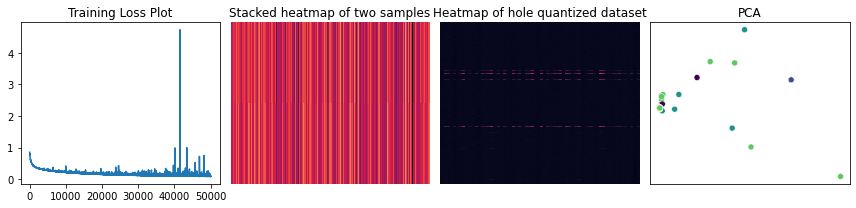

In [36]:
# Your additional code here
print(f"Additional code executed at epoch {epoch + 1}")
en_lat = []
en_quantized = []
en_reconstruction = []

VQ_VAE.eval()

data_set = Mydatasets(data1 = dat)
data_set = torch.utils.data.DataLoader(data_set, batch_size = 256, shuffle=False) 


for i in range(len(dat)):
    en_data = data_set.dataset[i][0]
    latent_1 = VQ_VAE._encoder(en_data.view(1, 1, feature_num).float().to(DEVICE))
    _, data_recon, _, _,latent_2 = VQ_VAE(en_data.view(1, 1, feature_num).float().to(DEVICE))
    en_lat.append(latent_1.cpu().detach().numpy())
    en_quantized.append(latent_2.cpu().detach().numpy())
    en_reconstruction.append(data_recon.cpu().detach().numpy())

encode_out = np.array(en_lat).reshape(len(dat), -1)
quantized_out = np.array(en_quantized).reshape(len(dat), -1)
reconstruction_out = np.array(en_reconstruction).reshape(len(dat), -1)


stack = np.vstack([dat[0].reshape(1, -1), reconstruction_out[0].reshape(1, -1)])


pca = PCA(n_components=2)
pca.fit(encode_out)
pca_result = pca.transform(encode_out)


fig, axs = plt.subplots(1, 4, figsize=(12, 3))


# Plot the line plot in the second subplot
axs[0].plot(train_res_recon_error, label='Training Loss')
axs[0].set_title('Training Loss Plot')
#axs[0].set_xticks([])

sns.heatmap(stack, ax=axs[1], cbar=False)
axs[1].set_title('Stacked heatmap of two samples')
axs[1].set_xticks([])
axs[1].set_yticks([])


sns.heatmap(encode_out, ax = axs[2], cbar=False)
axs[2].set_title('Heatmap of hole quantized dataset')
axs[2].set_xticks([])
axs[2].set_yticks([])


sns.scatterplot(x = pca_result[:, 0], y = pca_result[:, 1], c=label, ax=axs[3])
axs[3].set_title('PCA')
axs[3].set_xticks([])
axs[3].set_yticks([])

plt.subplots_adjust(wspace=0)  
plt.tight_layout()
plt.show()


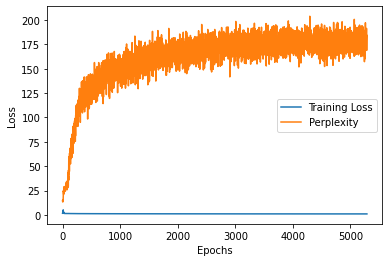

0.0001


In [11]:
# Plot training and validation loss curves
epochs = np.arange(1, EPOCH + 1)
plt.plot(train_res_recon_error, label='Training Loss')
plt.plot(perplexities, label='Perplexity')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

print(optimizer.param_groups[0]['lr'])

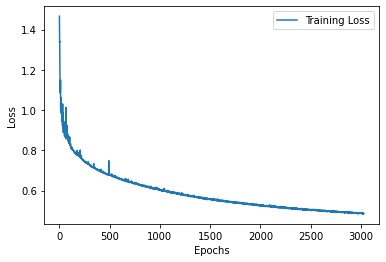

In [14]:
index = 50
plt.plot(train_res_recon_error[index:], label='Training Loss')
#plt.plot(epochs[index:], val_res_recon_error[index:], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

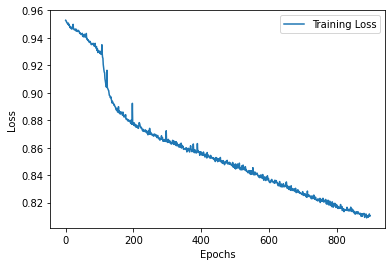

In [34]:
index = 1000

plt.plot(train_res_recon_error[100:], label='Training Loss')
#plt.plot(epochs[index:], val_res_recon_error[index:], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

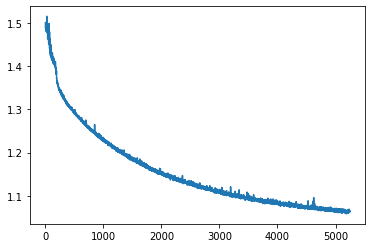

In [13]:
plt.plot(train_res_recon_error[40:], label='Training Loss')
#plt.plot(val_res_recon_error[40:], label='Training Loss')


In [50]:
en_lat = []
en_quantized = []
en_reconstruction = []

VQ_VAE.eval()

data_set = Mydatasets(data1 = dat)
data_set = torch.utils.data.DataLoader(data_set, batch_size = 256, shuffle=False) 


for i in range(len(dat)):
    en_data = data_set.dataset[i][0]
    latent_1 = VQ_VAE._encoder(en_data.view(1, 1, feature_num).float().to(DEVICE))
    _, data_recon, _, _,latent_2 = VQ_VAE(en_data.view(1, 1, feature_num).float().to(DEVICE))
    en_lat.append(latent_1.cpu().detach().numpy())
    en_quantized.append(latent_2.cpu().detach().numpy())
    en_reconstruction.append(data_recon.cpu().detach().numpy())

encode_out = np.array(en_lat)
encode_out = encode_out.reshape(len(dat), -1)
quantized_out = np.array(en_quantized)
quantized_out = quantized_out.reshape(len(dat), -1)
reconstruction_out = np.array(en_reconstruction)
reconstruction_out = reconstruction_out.reshape(len(dat), -1)

print('encode_out:', encode_out.shape)
print('quantized_out:', quantized_out.shape)

encode_out: (638, 64)
quantized_out: (638, 512)


In [51]:
# compatibility between notebooks
decoded_data = reconstruction_out
label = pd.Series(label)

In [52]:
#print(data.shape)
print(dat.shape)
print(encode_out.shape)
print(quantized_out.shape)
print(reconstruction_out.shape)

(638, 1, 11327)
(638, 64)
(638, 512)
(638, 11327)


In [53]:
fig = sp.make_subplots(rows=2, cols=1, shared_xaxes=False, vertical_spacing=0.1)
# Add the original image as a heatmap-like plot
#heatmap_trace1 = go.Heatmap(z=data[0].reshape(1, -1) )
heatmap_trace1 = go.Heatmap(z=dat[0].reshape(1, -1) )
fig.add_trace(heatmap_trace1, row=1, col=1)



# Add the decoded image as a heatmap-like plot
heatmap_trace3 = go.Heatmap(z=reconstruction_out[0].reshape(1, -1))
fig.add_trace(heatmap_trace3, row=2, col=1)
# Update layout
fig.update_layout(title='Stacked Graph of Image and Latent Space', showlegend=False)
fig.show()

/opt/homebrew/anaconda3/envs/thesis/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



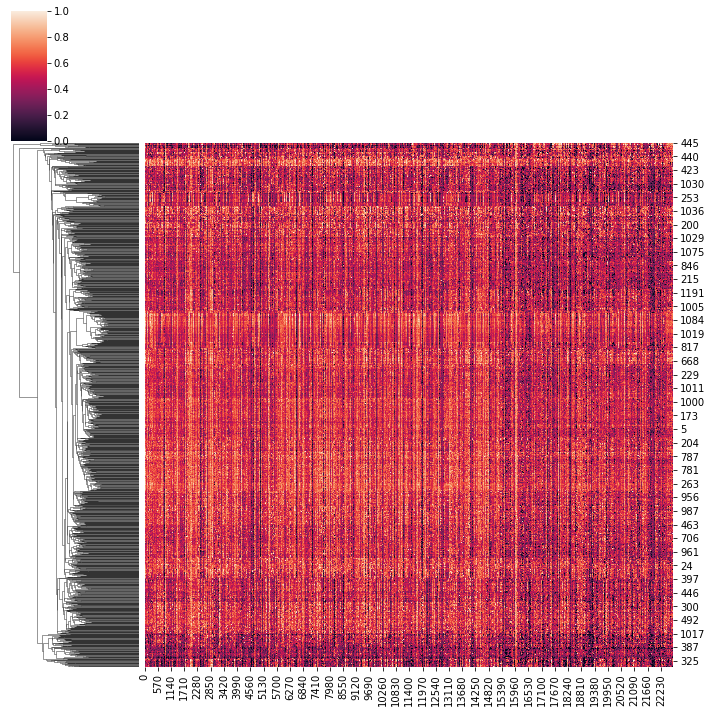

In [18]:
sns.clustermap(data, col_cluster= False)

/opt/homebrew/anaconda3/envs/thesis/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/opt/homebrew/anaconda3/envs/thesis/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



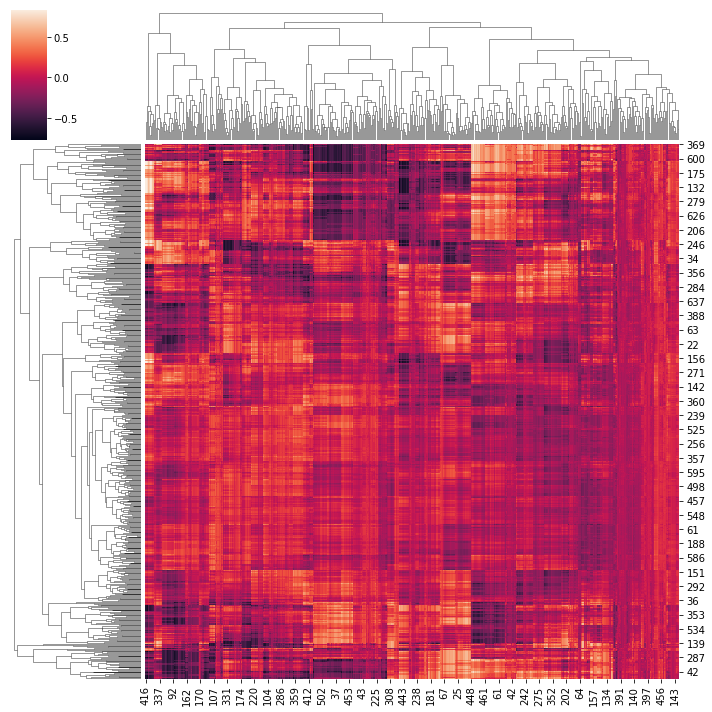

In [39]:
sns.clustermap(quantized_out)

/opt/homebrew/anaconda3/envs/thesis/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



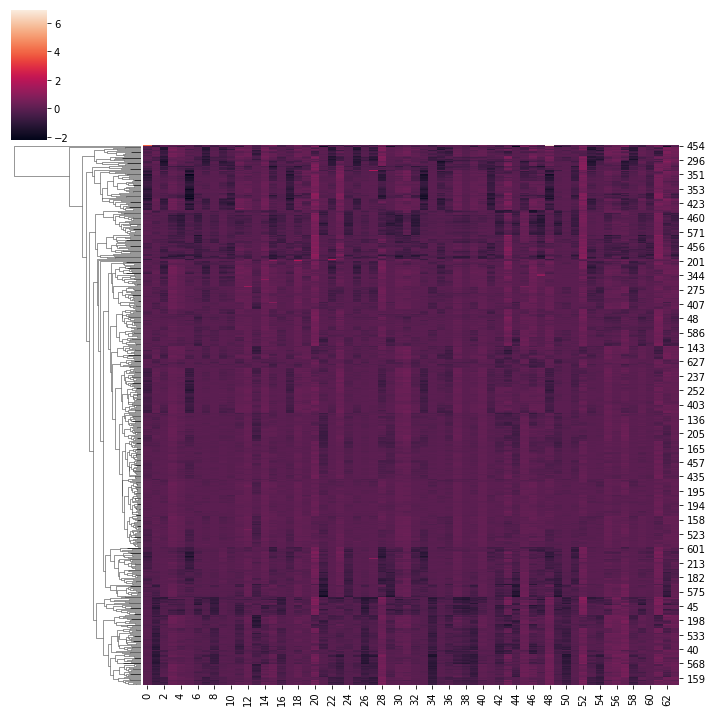

In [40]:
sns.clustermap(encode_out, col_cluster= False)

<Axes: >

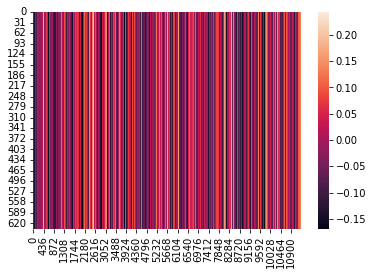

In [29]:
#sns.clustermap(decoded_data, col_cluster= False)
sns.heatmap(reconstruction_out)

<Axes: >

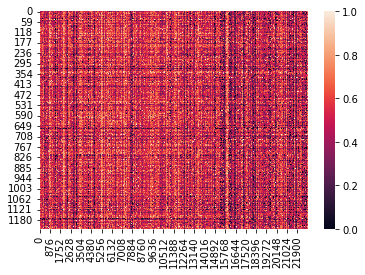

In [22]:
sns.heatmap(data)

In [1]:
label = [l[0] for l in label]

NameError: name 'label' is not defined

In [2]:
importlib.reload(visualisation)

print("######################## OG Groups : ")
#visualisation.plot_clusters(encode_out, label)
visualisation.plot_clusters(encode_out, pd.Series(label))

NameError: name 'importlib' is not defined

### what happens when i use keras 

In [ ]:
from models import vanilla_autoencoder
import tensorflow as tf
from tensorflow.keras import callbacks
import datetime

In [ ]:
with open('../workfiles/BRCA_ds.pkl', 'rb') as f:
#with open('../workfiles/normed_BRCA_ds.pkl', 'rb') as f:
    
    data_original, metadata = pickle.load(f)

In [ ]:
seq_names = metadata["sequence_names"]
n_genes = metadata["n_features"]
gene_names = metadata["feature_names"] 

In [ ]:
importlib.reload(vanilla_autoencoder) # to allow modification of the script without restarting the whole session

latent_dim = 16

t_shape = (n_genes)


autoencoder = vanilla_autoencoder.generate_model(t_shape, latent_dim)
autoencoder.compile(optimizer='adam', loss=tf.keras.losses.MeanSquaredError())

In [ ]:
checkpoint_filepath = '../workfiles/simple_ae/checkpoint'
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='loss',
    mode='min',
    save_best_only=True)


reduce_lr = callbacks.ReduceLROnPlateau(monitor='loss', factor=0.2,
                              patience=20, min_lr=0.00001)

early_stopping_callback = callbacks.EarlyStopping(monitor='loss', patience=70)


log_dir = "../workfiles/logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

cb = [model_checkpoint_callback, reduce_lr, early_stopping_callback, tensorboard_callback]

In [ ]:
autoencoder.load_weights(checkpoint_filepath)

In [ ]:
hist = autoencoder.fit(data_original, epochs=200, callbacks=cb)  
autoencoder.load_weights(checkpoint_filepath)

In [ ]:
plt.plot(hist.history["loss"])

In [ ]:
compressed_dataframe = autoencoder.encoder.predict(data)

In [ ]:
sns.clustermap(compressed_dataframe, col_cluster= False)

In [ ]:
recon_data = autoencoder.decoder.predict(compressed_dataframe)

In [ ]:
sns.clustermap(recon_data, col_cluster= False)

# who gets the best loss?

In [ ]:
# torch dataset
squared_error = np.square(filtered_data - reconstruction_out)
mse = np.mean(squared_error)

print("Mean Squared Error:", mse)

In [ ]:
# tensorflow
squared_error = np.square(data_original - recon_data)
mse = np.mean(squared_error)

print("Mean Squared Error:", mse)

In [ ]:
visualisation.plot_clusters(compressed_dataframe, metadata['PAM50_labels'])

# clustering perf analysis

In [ ]:
from sklearn.metrics import confusion_matrix


In [ ]:
linked = linkage(encode_out, 'ward', 'euclidean')  # You can use other linkage methods as well
plt.figure(figsize=(10, 5))
dendrogram(linked, orientation='top', distance_sort='descending')
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

# Determine the number of clusters (adjust the threshold as needed)
threshold = 50  # Adjust this threshold to identify clusters
cluster_labels = fcluster(linked, threshold, criterion='distance')

cm = confusion_matrix(cluster_labels, filtered_labs)
cm_df = pd.DataFrame(cm, 
                     index=["Actual 0", "Actual 1", "Actual 2", "Actual 3", "Actual 4"], 
                     columns=["Predicted 0", "Predicted 1", "Predicted 2", "Predicted 3", "Predicted 4"])

print(cm_df)
sns.heatmap(cm_df)

In [ ]:
linked = linkage(compressed_dataframe, 'ward', 'euclidean')  # You can use other linkage methods as well
plt.figure(figsize=(10, 5))
dendrogram(linked, orientation='top', distance_sort='descending')
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

# Determine the number of clusters (adjust the threshold as needed)
threshold = 290  # Adjust this threshold to identify clusters
cluster_labels = fcluster(linked, threshold, criterion='distance')


# Identify potential outliers (clusters with a small number of points)
unique_labels, counts = np.unique(cluster_labels, return_counts=True)
outlier_clusters = unique_labels[counts < threshold]
print(unique_labels)

cm = confusion_matrix(cluster_labels, metadata['PAM50_labels'])
cm_df = pd.DataFrame(cm, 
                     index=["Actual 0", "Actual 1", "Actual 2", "Actual 3", "Actual 4"], 
                     columns=["Predicted 0", "Predicted 1", "Predicted 2", "Predicted 3", "Predicted 4"])

print(cm_df)
sns.heatmap(cm_df)